In [121]:
import requests # library to handle requests
import pandas as pd # library for data analsysis
import numpy as np # library to handle data in a vectorized manner
import random # library for random number generation

!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim # module to convert an address into latitude and longitude values

# libraries for displaying images
from IPython.display import Image 
from IPython.core.display import HTML 
    
# tranforming json file into a pandas dataframe library
from pandas.io.json import json_normalize

!conda install -c conda-forge folium=0.5.0 --yes
import folium # plotting library

print('Folium installed')
print('Libraries imported.')

Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.

Folium installed
Libraries imported.


In [532]:
url = "https://en.wikipedia.org/wiki/Germany#Politics"
dfs = pd.read_html(url) #number of tables in the wiki page
df_states = dfs[2]

df_states = df_states.drop(df_states.index[0]) #drop the unwanted first row

df_states = df_states.rename(columns=df_states.iloc[0]).drop(df_states.index[0]) #make the first row as columns

df_states

,State,Capital,Area (km2)[128],Population (2018)[129],Nominal GDP billions EUR (2015)[130],Nominal GDP per capita EUR (2015)[130]
2,Baden-Württemberg,Stuttgart,35751,11069533,461,42800
3,Bavaria,Munich,70550,13076721,550,43100
4,Berlin,Berlin,892,3644826,125,35700
5,Brandenburg,Potsdam,29654,2511917,66,26500
6,Bremen,Bremen,420,682986,32,47600
7,Hamburg,Hamburg,755,1841179,110,61800
8,Hesse,Wiesbaden,21115,6265809,264,43100
9,Mecklenburg-Vorpommern,Schwerin,23214,1609675,40,25000
10,Lower Saxony,Hanover,47593,7982448,259,32900
11,North Rhine-Westphalia,Düsseldorf,34113,17932651,646,36500


In [533]:
url = "https://en.wikipedia.org/wiki/ISO_3166-2:DE#Current_codes"
dfs = pd.read_html(url) #number of tables in the wiki page
df = dfs[0]

df = df.rename({'Subdivision Name (en)[note 1]':'State'}, axis = 'columns')
df


,Code,Subdivision Name (de),State
0,DE-BW,Baden-Württemberg,Baden-Württemberg
1,DE-BY,Bayern,Bavaria
2,DE-BE,Berlin,Berlin
3,DE-BB,Brandenburg,Brandenburg
4,DE-HB,Bremen,Bremen
5,DE-HH,Hamburg,Hamburg
6,DE-HE,Hessen,Hesse
7,DE-MV,Mecklenburg-Vorpommern,Mecklenburg-Western Pomerania
8,DE-NI,Niedersachsen,Lower Saxony
9,DE-NW,Nordrhein-Westfalen,North Rhine-Westphalia


In [534]:

df.loc[7,'State'] = 'Mecklenburg-Vorpommern'
print(df)
df_states = pd.merge(df, df_states, on = ['State'], how = 'inner')
df_states

     Code   Subdivision Name (de)                   State
0   DE-BW       Baden-Württemberg       Baden-Württemberg
1   DE-BY                  Bayern                 Bavaria
2   DE-BE                  Berlin                  Berlin
3   DE-BB             Brandenburg             Brandenburg
4   DE-HB                  Bremen                  Bremen
5   DE-HH                 Hamburg                 Hamburg
6   DE-HE                  Hessen                   Hesse
7   DE-MV  Mecklenburg-Vorpommern  Mecklenburg-Vorpommern
8   DE-NI           Niedersachsen            Lower Saxony
9   DE-NW     Nordrhein-Westfalen  North Rhine-Westphalia
10  DE-RP         Rheinland-Pfalz    Rhineland-Palatinate
11  DE-SL                Saarland                Saarland
12  DE-SN                 Sachsen                  Saxony
13  DE-ST          Sachsen-Anhalt           Saxony-Anhalt
14  DE-SH      Schleswig-Holstein      Schleswig-Holstein
15  DE-TH               Thüringen               Thuringia


,Code,Subdivision Name (de),State,Capital,Area (km2)[128],Population (2018)[129],Nominal GDP billions EUR (2015)[130],Nominal GDP per capita EUR (2015)[130]
0,DE-BW,Baden-Württemberg,Baden-Württemberg,Stuttgart,35751,11069533,461,42800
1,DE-BY,Bayern,Bavaria,Munich,70550,13076721,550,43100
2,DE-BE,Berlin,Berlin,Berlin,892,3644826,125,35700
3,DE-BB,Brandenburg,Brandenburg,Potsdam,29654,2511917,66,26500
4,DE-HB,Bremen,Bremen,Bremen,420,682986,32,47600
5,DE-HH,Hamburg,Hamburg,Hamburg,755,1841179,110,61800
6,DE-HE,Hessen,Hesse,Wiesbaden,21115,6265809,264,43100
7,DE-MV,Mecklenburg-Vorpommern,Mecklenburg-Vorpommern,Schwerin,23214,1609675,40,25000
8,DE-NI,Niedersachsen,Lower Saxony,Hanover,47593,7982448,259,32900
9,DE-NW,Nordrhein-Westfalen,North Rhine-Westphalia,Düsseldorf,34113,17932651,646,36500


In [535]:
url = "https://en.wikipedia.org/wiki/List_of_German_states_by_population_density"
dfs = pd.read_html(url) #number of tables in the wiki page
df_population_density = dfs[0]
df_population_density

df_population_density=df_population_density.rename({'1995':'Pop_den_1995','2000':'Pop_den_2000','2005':'Pop_den_2005','2010':'Pop_den_2010','2017':'Pop_den_2017'},axis='columns')
df_population_density

,State,Pop_den_1995,Pop_den_2000,Pop_den_2005,Pop_den_2010,Pop_den_2017
0,Baden-Württemberg,289,294,300,301,308
1,Bavaria,170,173,177,178,184
2,Berlin,3897,3793,3807,3899,4055
3,Brandenburg,86,88,87,85,84
4,Bremen,1682,1633,1641,1576,1624
5,Hamburg,2262,2271,2 309,2 366,2424
6,Hesse,285,287,289,287,296
7,Lower Saxony,163,166,168,166,167
8,Mecklenburg-Vorpommern,79,77,74,71,69
9,North Rhine-Westphalia,525,528,530,523,525


In [536]:
df_states = pd.merge(df_states, df_population_density, on = ['State'], how = 'inner')
df_states

,Code,Subdivision Name (de),State,Capital,Area (km2)[128],Population (2018)[129],Nominal GDP billions EUR (2015)[130],Nominal GDP per capita EUR (2015)[130],Pop_den_1995,Pop_den_2000,Pop_den_2005,Pop_den_2010,Pop_den_2017
0,DE-BW,Baden-Württemberg,Baden-Württemberg,Stuttgart,35751,11069533,461,42800,289,294,300,301,308
1,DE-BY,Bayern,Bavaria,Munich,70550,13076721,550,43100,170,173,177,178,184
2,DE-BE,Berlin,Berlin,Berlin,892,3644826,125,35700,3897,3793,3807,3899,4055
3,DE-BB,Brandenburg,Brandenburg,Potsdam,29654,2511917,66,26500,86,88,87,85,84
4,DE-HB,Bremen,Bremen,Bremen,420,682986,32,47600,1682,1633,1641,1576,1624
5,DE-HH,Hamburg,Hamburg,Hamburg,755,1841179,110,61800,2262,2271,2 309,2 366,2424
6,DE-HE,Hessen,Hesse,Wiesbaden,21115,6265809,264,43100,285,287,289,287,296
7,DE-MV,Mecklenburg-Vorpommern,Mecklenburg-Vorpommern,Schwerin,23214,1609675,40,25000,79,77,74,71,69
8,DE-NI,Niedersachsen,Lower Saxony,Hanover,47593,7982448,259,32900,163,166,168,166,167
9,DE-NW,Nordrhein-Westfalen,North Rhine-Westphalia,Düsseldorf,34113,17932651,646,36500,525,528,530,523,525


In [537]:

url = "https://en.wikipedia.org/wiki/Economy_of_Germany#German_states"
dfs = pd.read_html(url) #number of tables in the wiki page
df_gdp = dfs[6]
df_gdp =df_gdp.drop(['Comparable economy','Rank'], axis=1)
df_gdp = df_gdp.drop(df_states.index[0])
df_gdp
df_gdp = df_gdp.rename({'States':'State'}, axis = 'columns')

df_gdp

,State,GRP (in billions EUR€),Share of GDP (%)
1,North Rhine-Westphalia,705,21.2
2,Bavaria,625,18.2
3,Baden-Württemberg,511,15.1
4,Lower Saxony,296,8.8
5,Hesse,292,8.6
6,Rhineland-Palatinate,149,4.4
7,Berlin,147,4.2
8,Saxony,126,3.8
9,Hamburg,120,3.6
10,Schleswig-Holstein,97,2.9


In [538]:
df_states = pd.merge(df_states, df_gdp, on = ['State'], how = 'inner')
df_states

,Code,Subdivision Name (de),State,Capital,Area (km2)[128],Population (2018)[129],Nominal GDP billions EUR (2015)[130],Nominal GDP per capita EUR (2015)[130],Pop_den_1995,Pop_den_2000,Pop_den_2005,Pop_den_2010,Pop_den_2017,GRP (in billions EUR€),Share of GDP (%)
0,DE-BW,Baden-Württemberg,Baden-Württemberg,Stuttgart,35751,11069533,461,42800,289,294,300,301,308,511,15.1
1,DE-BY,Bayern,Bavaria,Munich,70550,13076721,550,43100,170,173,177,178,184,625,18.2
2,DE-BE,Berlin,Berlin,Berlin,892,3644826,125,35700,3897,3793,3807,3899,4055,147,4.2
3,DE-BB,Brandenburg,Brandenburg,Potsdam,29654,2511917,66,26500,86,88,87,85,84,74,2.1
4,DE-HB,Bremen,Bremen,Bremen,420,682986,32,47600,1682,1633,1641,1576,1624,34,1.0
5,DE-HH,Hamburg,Hamburg,Hamburg,755,1841179,110,61800,2262,2271,2 309,2 366,2424,120,3.6
6,DE-HE,Hessen,Hesse,Wiesbaden,21115,6265809,264,43100,285,287,289,287,296,292,8.6
7,DE-MV,Mecklenburg-Vorpommern,Mecklenburg-Vorpommern,Schwerin,23214,1609675,40,25000,79,77,74,71,69,45,1.3
8,DE-NI,Niedersachsen,Lower Saxony,Hanover,47593,7982448,259,32900,163,166,168,166,167,296,8.8
9,DE-NW,Nordrhein-Westfalen,North Rhine-Westphalia,Düsseldorf,34113,17932651,646,36500,525,528,530,523,525,705,21.2


In [539]:

url = "https://en.wikipedia.org/wiki/List_of_German_states_by_Human_Development_Index"
dfs = pd.read_html(url, header=0) #number of tables in the wiki page
df_hdi = dfs[0]

df_hdi = df_hdi.drop(df_hdi.index[0]) #make the first row as columns
df_hdi = df_hdi.drop(['Rank','Unnamed: 4','Comparable country (2018)[2]'], axis='columns')
df_hdi


,State,HDI (2018)
1,Hamburg,0.975
2,Baden-Württemberg,0.953
3,Bremen,0.951
4,Berlin,0.950
5,Hesse,0.949
6,Bavaria,0.947
7,Germany,0.939
8,North Rhine-Westphalia,0.936
9,Saarland,0.931
10,Saxony,0.930


In [540]:
df_states = pd.merge(df_states, df_hdi, on = ['State'], how = 'inner')
df_states

,Code,Subdivision Name (de),State,Capital,Area (km2)[128],Population (2018)[129],Nominal GDP billions EUR (2015)[130],Nominal GDP per capita EUR (2015)[130],Pop_den_1995,Pop_den_2000,Pop_den_2005,Pop_den_2010,Pop_den_2017,GRP (in billions EUR€),Share of GDP (%),HDI (2018)
0,DE-BW,Baden-Württemberg,Baden-Württemberg,Stuttgart,35751,11069533,461,42800,289,294,300,301,308,511,15.1,0.953
1,DE-BY,Bayern,Bavaria,Munich,70550,13076721,550,43100,170,173,177,178,184,625,18.2,0.947
2,DE-BE,Berlin,Berlin,Berlin,892,3644826,125,35700,3897,3793,3807,3899,4055,147,4.2,0.950
3,DE-BB,Brandenburg,Brandenburg,Potsdam,29654,2511917,66,26500,86,88,87,85,84,74,2.1,0.914
4,DE-HB,Bremen,Bremen,Bremen,420,682986,32,47600,1682,1633,1641,1576,1624,34,1.0,0.951
5,DE-HH,Hamburg,Hamburg,Hamburg,755,1841179,110,61800,2262,2271,2 309,2 366,2424,120,3.6,0.975
6,DE-HE,Hessen,Hesse,Wiesbaden,21115,6265809,264,43100,285,287,289,287,296,292,8.6,0.949
7,DE-MV,Mecklenburg-Vorpommern,Mecklenburg-Vorpommern,Schwerin,23214,1609675,40,25000,79,77,74,71,69,45,1.3,0.910
8,DE-NI,Niedersachsen,Lower Saxony,Hanover,47593,7982448,259,32900,163,166,168,166,167,296,8.8,0.922
9,DE-NW,Nordrhein-Westfalen,North Rhine-Westphalia,Düsseldorf,34113,17932651,646,36500,525,528,530,523,525,705,21.2,0.936


In [541]:

url = "https://en.wikipedia.org/wiki/List_of_German_states_by_unemployment_rate"
dfs = pd.read_html(url, header=0) #number of tables in the wiki page
df_unemployment = dfs[0]

df_unemployment

df_unemployment = df_unemployment.drop(['Rank'], axis='columns')
df_unemployment= df_unemployment.rename({'States':'State'}, axis = 'columns')

df_unemployment

,State,unemployment rate (July 2019)[1]
0,Bremen,10.2%
1,Berlin,8.0%
2,Saxony-Anhalt,7.0%
3,Mecklenburg-Vorpommern,6.7%
4,North Rhine-Westphalia,6.6%
5,Saarland,6.4%
6,Hamburg,6.3%
7,East Germany,6.3%
8,Brandenburg,5.7%
9,Saxony,5.3%


In [542]:
df_states = pd.merge(df_states, df_unemployment, on = ['State'], how = 'inner')
df_states

,Code,Subdivision Name (de),State,Capital,Area (km2)[128],Population (2018)[129],Nominal GDP billions EUR (2015)[130],Nominal GDP per capita EUR (2015)[130],Pop_den_1995,Pop_den_2000,Pop_den_2005,Pop_den_2010,Pop_den_2017,GRP (in billions EUR€),Share of GDP (%),HDI (2018),unemployment rate (July 2019)[1]
0,DE-BW,Baden-Württemberg,Baden-Württemberg,Stuttgart,35751,11069533,461,42800,289,294,300,301,308,511,15.1,0.953,3.1%
1,DE-BY,Bayern,Bavaria,Munich,70550,13076721,550,43100,170,173,177,178,184,625,18.2,0.947,2.7%
2,DE-BE,Berlin,Berlin,Berlin,892,3644826,125,35700,3897,3793,3807,3899,4055,147,4.2,0.950,8.0%
3,DE-BB,Brandenburg,Brandenburg,Potsdam,29654,2511917,66,26500,86,88,87,85,84,74,2.1,0.914,5.7%
4,DE-HB,Bremen,Bremen,Bremen,420,682986,32,47600,1682,1633,1641,1576,1624,34,1.0,0.951,10.2%
5,DE-HH,Hamburg,Hamburg,Hamburg,755,1841179,110,61800,2262,2271,2 309,2 366,2424,120,3.6,0.975,6.3%
6,DE-HE,Hessen,Hesse,Wiesbaden,21115,6265809,264,43100,285,287,289,287,296,292,8.6,0.949,4.5%
7,DE-MV,Mecklenburg-Vorpommern,Mecklenburg-Vorpommern,Schwerin,23214,1609675,40,25000,79,77,74,71,69,45,1.3,0.910,6.7%
8,DE-NI,Niedersachsen,Lower Saxony,Hanover,47593,7982448,259,32900,163,166,168,166,167,296,8.8,0.922,5.1%
9,DE-NW,Nordrhein-Westfalen,North Rhine-Westphalia,Düsseldorf,34113,17932651,646,36500,525,528,530,523,525,705,21.2,0.936,6.6%


In [543]:
df_states = df_states.drop(['Pop_den_1995','Pop_den_2000','Pop_den_2005','Pop_den_2010'], axis=1)
df_states

,Code,Subdivision Name (de),State,Capital,Area (km2)[128],Population (2018)[129],Nominal GDP billions EUR (2015)[130],Nominal GDP per capita EUR (2015)[130],Pop_den_2017,GRP (in billions EUR€),Share of GDP (%),HDI (2018),unemployment rate (July 2019)[1]
0,DE-BW,Baden-Württemberg,Baden-Württemberg,Stuttgart,35751,11069533,461,42800,308,511,15.1,0.953,3.1%
1,DE-BY,Bayern,Bavaria,Munich,70550,13076721,550,43100,184,625,18.2,0.947,2.7%
2,DE-BE,Berlin,Berlin,Berlin,892,3644826,125,35700,4055,147,4.2,0.950,8.0%
3,DE-BB,Brandenburg,Brandenburg,Potsdam,29654,2511917,66,26500,84,74,2.1,0.914,5.7%
4,DE-HB,Bremen,Bremen,Bremen,420,682986,32,47600,1624,34,1.0,0.951,10.2%
5,DE-HH,Hamburg,Hamburg,Hamburg,755,1841179,110,61800,2424,120,3.6,0.975,6.3%
6,DE-HE,Hessen,Hesse,Wiesbaden,21115,6265809,264,43100,296,292,8.6,0.949,4.5%
7,DE-MV,Mecklenburg-Vorpommern,Mecklenburg-Vorpommern,Schwerin,23214,1609675,40,25000,69,45,1.3,0.910,6.7%
8,DE-NI,Niedersachsen,Lower Saxony,Hanover,47593,7982448,259,32900,167,296,8.8,0.922,5.1%
9,DE-NW,Nordrhein-Westfalen,North Rhine-Westphalia,Düsseldorf,34113,17932651,646,36500,525,705,21.2,0.936,6.6%


In [544]:
add = df_states['State'].to_list()
print(add)


from geopy.geocoders import Nominatim
address = add

Location = pd.DataFrame(columns=['State','Latitude','Longitude'])

geolocator = Nominatim(user_agent="foursquare_agent", timeout =10)

for val in add:
    location = geolocator.geocode(val)
    latitude = location.latitude
    longitude = location.longitude
    Location.loc[val]= [val,latitude,longitude]

Location


['Baden-Württemberg', 'Bavaria', 'Berlin', 'Brandenburg', 'Bremen', 'Hamburg', 'Hesse', 'Mecklenburg-Vorpommern', 'Lower Saxony', 'North Rhine-Westphalia', 'Rhineland-Palatinate', 'Saarland', 'Saxony', 'Saxony-Anhalt', 'Schleswig-Holstein', 'Thuringia']


,State,Latitude,Longitude
Baden-Württemberg,Baden-Württemberg,48.629697,9.194953
Bavaria,Bavaria,48.946756,11.403872
Berlin,Berlin,52.517037,13.388860
Brandenburg,Brandenburg,52.845549,13.246130
Bremen,Bremen,53.075820,8.807165
Hamburg,Hamburg,53.543764,10.009913
Hesse,Hesse,50.611854,9.190973
Mecklenburg-Vorpommern,Mecklenburg-Vorpommern,53.773523,12.575575
Lower Saxony,Lower Saxony,52.839853,9.075962
North Rhine-Westphalia,North Rhine-Westphalia,51.478180,7.554234


In [545]:
df_states = pd.merge(df_states, Location, on = ['State'], how = 'inner')
df_states

,Code,Subdivision Name (de),State,Capital,Area (km2)[128],Population (2018)[129],Nominal GDP billions EUR (2015)[130],Nominal GDP per capita EUR (2015)[130],Pop_den_2017,GRP (in billions EUR€),Share of GDP (%),HDI (2018),unemployment rate (July 2019)[1],Latitude,Longitude
0,DE-BW,Baden-Württemberg,Baden-Württemberg,Stuttgart,35751,11069533,461,42800,308,511,15.1,0.953,3.1%,48.629697,9.194953
1,DE-BY,Bayern,Bavaria,Munich,70550,13076721,550,43100,184,625,18.2,0.947,2.7%,48.946756,11.403872
2,DE-BE,Berlin,Berlin,Berlin,892,3644826,125,35700,4055,147,4.2,0.950,8.0%,52.517037,13.388860
3,DE-BB,Brandenburg,Brandenburg,Potsdam,29654,2511917,66,26500,84,74,2.1,0.914,5.7%,52.845549,13.246130
4,DE-HB,Bremen,Bremen,Bremen,420,682986,32,47600,1624,34,1.0,0.951,10.2%,53.075820,8.807165
5,DE-HH,Hamburg,Hamburg,Hamburg,755,1841179,110,61800,2424,120,3.6,0.975,6.3%,53.543764,10.009913
6,DE-HE,Hessen,Hesse,Wiesbaden,21115,6265809,264,43100,296,292,8.6,0.949,4.5%,50.611854,9.190973
7,DE-MV,Mecklenburg-Vorpommern,Mecklenburg-Vorpommern,Schwerin,23214,1609675,40,25000,69,45,1.3,0.910,6.7%,53.773523,12.575575
8,DE-NI,Niedersachsen,Lower Saxony,Hanover,47593,7982448,259,32900,167,296,8.8,0.922,5.1%,52.839853,9.075962
9,DE-NW,Nordrhein-Westfalen,North Rhine-Westphalia,Düsseldorf,34113,17932651,646,36500,525,705,21.2,0.936,6.6%,51.478180,7.554234


<H2>Practice map to plot places</H2>

In [546]:


# create map of Toronto using latitude and longitude values
map_de = folium.Map(location=[51.1657, 10.4515],zoom_start=6)

# add markers to map
for lat, lng, label in zip(df_states['Latitude'], df_states['Longitude'], df_states['State']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_de)  
    

    
map_de

<H1> Population per State - Germany </H1>

In [547]:
de_geo = 'germany.json' # geojson file

df_states['Population (2018)[129]']=df_states['Population (2018)[129]'].astype(int)

# create a map.
de_map = folium.Map(location=[51.1657, 10.4515], zoom_start=5)

de_map.choropleth(
    geo_data=de_geo,
    data=df_states,
    columns=['Code', 'Population (2018)[129]'],
    key_on='feature.properties.id',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Population Density',
    reset=True,
)
de_map

<H1>Population Per State</H1>

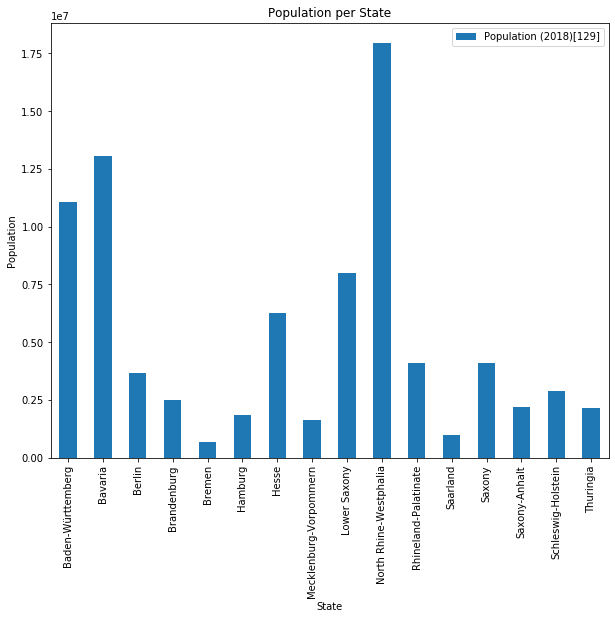

In [548]:
import matplotlib as mpl
import matplotlib.pyplot as plt


df_states.plot(x='State',y='Population (2018)[129]',kind='bar', figsize=(10,8))

plt.title('Population per State')
plt.ylabel('Population')
plt.xlabel('State')

plt.show()


<H1>Gross Domestic Product vs Human Development Index</H1>


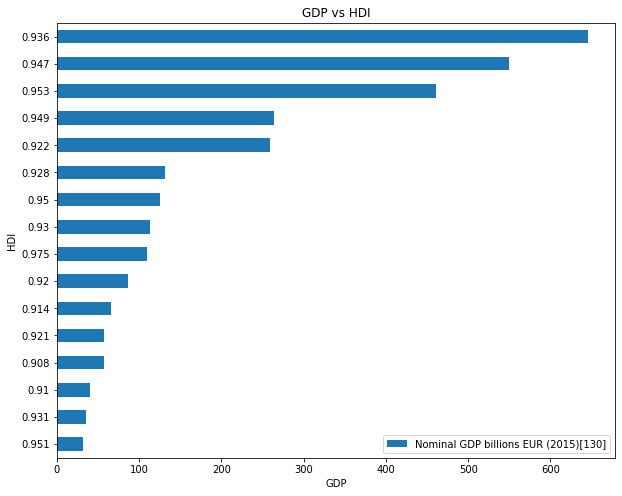

In [549]:
df_states['HDI (2018)']=df_states['HDI (2018)'].astype(float)

df_states['Nominal GDP billions EUR (2015)[130]']=df_states['Nominal GDP billions EUR (2015)[130]'].astype(int)
df_states.sort_values(by=['Nominal GDP billions EUR (2015)[130]'],inplace=True)
df_states.plot(x='HDI (2018)',y='Nominal GDP billions EUR (2015)[130]',kind='barh', figsize=(10,8))

plt.title('GDP vs HDI')
plt.ylabel('HDI')
plt.xlabel('GDP')

plt.show()

In [558]:
de_geo = 'germany.json' # geojson file

df_states['HDI (2018)']=df_states['HDI (2018)'].astype(float)

# create a map.
de_map = folium.Map(location=[51.1657, 10.4515], zoom_start=5)

de_map.choropleth(
    geo_data=de_geo,
    data=df_states,
    columns=['Code', 'HDI (2018)'],
    key_on='feature.properties.id',
    fill_color='YlOrRd', 
    
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Human Development Index',
    reset=True,
)
de_map

<H1> Gross Domestic Product vs Unemployment rate</H1>

In [551]:
df_states['unemployment rate (July 2019)[1]'] = [x.strip('%') for x in df_states['unemployment rate (July 2019)[1]']]

df_states

,Code,Subdivision Name (de),State,Capital,Area (km2)[128],Population (2018)[129],Nominal GDP billions EUR (2015)[130],Nominal GDP per capita EUR (2015)[130],Pop_den_2017,GRP (in billions EUR€),Share of GDP (%),HDI (2018),unemployment rate (July 2019)[1],Latitude,Longitude
4,DE-HB,Bremen,Bremen,Bremen,420,682986,32,47600,1624,34,1.0,0.951,10.2,53.075820,8.807165
11,DE-SL,Saarland,Saarland,Saarbrücken,2569,990509,35,35400,387,36,1.1,0.931,6.4,49.417399,6.980579
7,DE-MV,Mecklenburg-Vorpommern,Mecklenburg-Vorpommern,Schwerin,23214,1609675,40,25000,69,45,1.3,0.910,6.7,53.773523,12.575575
13,DE-ST,Sachsen-Anhalt,Saxony-Anhalt,Magdeburg,20452,2208321,57,25200,109,64,1.9,0.908,7.0,51.908526,11.493913
15,DE-TH,Thüringen,Thuringia,Erfurt,16202,2143145,57,26400,133,64,1.9,0.921,5.2,50.733316,11.074791
3,DE-BB,Brandenburg,Brandenburg,Potsdam,29654,2511917,66,26500,84,74,2.1,0.914,5.7,52.845549,13.246130
14,DE-SH,Schleswig-Holstein,Schleswig-Holstein,Kiel,15802,2896712,86,31200,183,97,2.9,0.920,5.1,54.185400,9.822009
5,DE-HH,Hamburg,Hamburg,Hamburg,755,1841179,110,61800,2424,120,3.6,0.975,6.3,53.543764,10.009913
12,DE-SN,Sachsen,Saxony,Dresden,18416,4077937,113,27800,221,126,3.8,0.930,5.3,50.929580,13.458505
2,DE-BE,Berlin,Berlin,Berlin,892,3644826,125,35700,4055,147,4.2,0.950,8.0,52.517037,13.388860


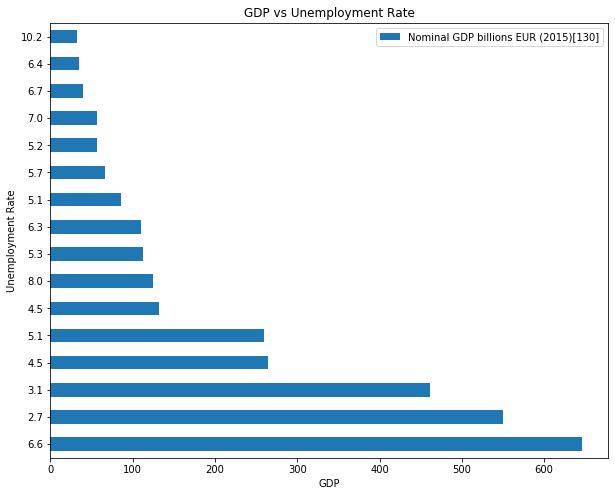

In [556]:
df_states['unemployment rate (July 2019)[1]']=df_states['unemployment rate (July 2019)[1]'].astype(float)
df_states['Nominal GDP billions EUR (2015)[130]']=df_states['Nominal GDP billions EUR (2015)[130]'].astype(int)

df_states.sort_values(by=['Nominal GDP billions EUR (2015)[130]'],ascending=False,inplace=True)
df_states.plot(x='unemployment rate (July 2019)[1]',y='Nominal GDP billions EUR (2015)[130]',kind='barh', figsize=(10,8))

plt.title('GDP vs Unemployment Rate')
plt.ylabel('Unemployment Rate')
plt.xlabel('GDP')

plt.show()

In [557]:
de_geo = 'germany.json' # geojson file

df_states['unemployment rate (July 2019)[1]']=df_states['unemployment rate (July 2019)[1]'].astype(float)

# create a map.
de_map = folium.Map(location=[51.1657, 10.4515], zoom_start=5)

de_map.choropleth(
    geo_data=de_geo,
    data=df_states,
    columns=['Code', 'unemployment rate (July 2019)[1]'],
    key_on='feature.properties.id',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Unemployment Rate',
    reset=True,
)
de_map